<a href="https://colab.research.google.com/github/AzizAgrebi/CapGemini_challenge/blob/Tim/test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p style="font-size:20px;color:#12ABDB;text-indent:2em">A. Libraries import</p>

In [29]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
from shapely.geometry import Polygon
from sklearn.model_selection import train_test_split
import os
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import torch

#my imports
from torchvision import transforms
import tqdm
import seaborn as sns

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# move to the challenge folder
os.chdir("/content/drive/MyDrive/data_challenge_mines")

<p style="font-size:20px;color:#12ABDB;text-indent:2em">B. Loading images</p>

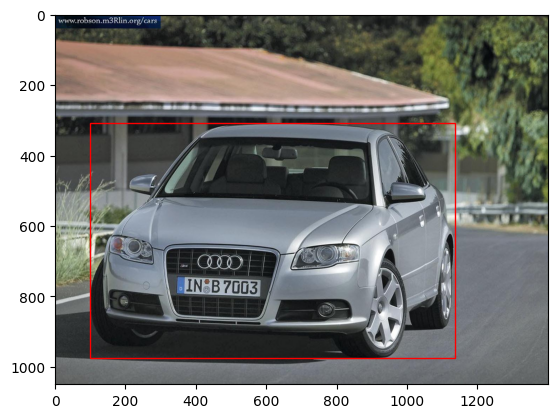

In [8]:
path_annotrain = "datasets_train/train_annotation/_annotation.csv"
train_annotation = pd.read_csv(path_annotrain)
bbox_train_full = train_annotation.loc[
    :, ["im_name", "x_min", "y_min", "x_max", "y_max"]
]
im_test = bbox_train_full.iloc[234, 0]
x1, y1, x2, y2 = bbox_train_full.loc[bbox_train_full["im_name"] == im_test].iloc[0, 1:]


def load_plot(im_name, x1, y1, x2, y2):
    """
    Load an image, display it, and draw a rectangle on it.

    Args:
        im_name (str): The name of the image file to load.
        x1 (int): The x-coordinate of the top-left corner of the rectangle.
        y1 (int): The y-coordinate of the top-left corner of the rectangle.
        x2 (int): The x-coordinate of the bottom-right corner of the rectangle.
        y2 (int): The y-coordinate of the bottom-right corner of the rectangle.

    Returns:
        Nothing.
    """
    im = np.asanyarray(Image.open(f"datasets_train/train/{im_name}"))

    # Display the image
    plt.imshow(im)

    # Get the current reference
    ax = plt.gca()

    # Create a Rectangle patch
    rect = patches.Rectangle(
        (x1, y1),
        x2 - x1,
        y2 - y1,
        linewidth=1,
        edgecolor="r",
        facecolor="none",
    )

    # Add the patch to the Axes
    ax.add_patch(rect)
    plt.show()


load_plot(im_test, x1, y1, x2, y2)

<p style="font-size:20px;color:#12ABDB;text-indent:2em">C. Splitting the Data into Train & Eval Set</p>

In [ ]:
# The split is 80% - 20% between Train and Eval (test_size=0.2)
bbox_train, bbox_eval = train_test_split(
    bbox_train_full, test_size=0.2, random_state=1234
)

<p style="font-size:20px;color:#12ABDB;text-indent:2em">D. Data Preprocessing</p>

In [ ]:
def normalize_images_and_boxes(bbox_data, target_size, image_directory):
    """
    Normalize the size of images and bounding boxes.

    Args:
    bbox_data (pandas.DataFrame): A DataFrame containing information about images and bounding boxes. It should have the following columns:
        - image_name: Name of the image file.
        - x1: X-coordinate of the top-left corner of the bounding box.
        - y1: Y-coordinate of the top-left corner of the bounding box.
        - x2: X-coordinate of the bottom-right corner of the bounding box.
        - y2: Y-coordinate of the bottom-right corner of the bounding box.
    target_size (tuple): A tuple (width, height) specifying the desired size to which images should be resized and normalized.
    image_directory (str): The directory path where the image files are located.

    Returns:
    numpy.ndarray: A numpy array containing the preprocessed images.

    numpy.ndarray: A numpy array containing the target labels, i.e., the scaled bounding boxes represented as [x1_scaled, y1_scaled, x2_scaled, y2_scaled].
    """

    images = []  # List to store the preprocessed images
    labels = []  # List to store the target labels (scaled bounding boxes)

    for index, row in bbox_data.iterrows():
        image_name, x1, y1, x2, y2 = row

        # Load and normalize the image
        image = load_img(f"{image_directory}/{image_name}", target_size=target_size)
        image = img_to_array(image) / 255.0
        images.append(image)

        # Calculate scaling factors for bounding box coordinates
        original_width, original_height = load_img(
            f"{image_directory}/{image_name}"
        ).size
        scale_x = target_size[0] / original_width
        scale_y = target_size[1] / original_height

        # Resize and scale bounding box coordinates
        x1_scaled = x1 * scale_x
        y1_scaled = y1 * scale_y
        x2_scaled = x2 * scale_x
        y2_scaled = y2 * scale_y

        label = [x1_scaled, y1_scaled, x2_scaled, y2_scaled]
        labels.append(label)

    return np.array(images), np.array(labels)


# Define other preprocessing functions here:
def other_preprocessing(data):
    # Write your code here
    return data


# Union all the preprocessing functions
def preprocess_data(data, preprocessing_functions):
    """
    Preprocesses the input data using a list of preprocessing functions.

    Args:
        data (Any): The input data to be preprocessed.
        preprocessing_functions (list): A list of functions to apply to the input data.

    Returns:
        Any: The preprocessed data after applying all specified preprocessing functions.
    """
    for func in preprocessing_functions:
        data = func(data)
    return data

<p style="font-size:20px;color:#12ABDB;text-indent:2em">E. Metric to be recommended to use</p>

In [14]:
def local_IoU(
    xmin_pred_i,
    xmax_pred_i,
    ymin_pred_i,
    ymax_pred_i,
    xmin_true_i,
    xmax_true_i,
    ymin_true_i,
    ymax_true_i,
):
    """This function calculates the IoU for the image i.

    Args:
        xmin_pred_i: Value of the prediction min x-axis.
        xmax_pred_i: Value of the prediction max x-axis.
        ymin_pred_i: Value of the prediction min y-axis.
        ymax_pred_i: Value of the prediction max y-axis.
        xmin_true_i: Value of the true min x-axis.
        xmax_true_i: Value of the true max x-axis.
        ymin_true_i: Value of the true min y-axis.
        ymax_true_i: Value of the true max y-axis.

    Returns:
        The return value is the intersection over union.

    """
    if (xmin_true_i, xmax_true_i, ymin_true_i, ymax_true_i) == (0, 0, 0, 0):
        if (xmin_pred_i, xmax_pred_i, ymin_pred_i, ymax_pred_i) == (
            0,
            0,
            0,
            0,
        ):
            return 1

        else:
            return 0

    else:
        box_pred_i = [
            [xmin_pred_i, ymin_pred_i],
            [xmax_pred_i, ymin_pred_i],
            [xmax_pred_i, ymax_pred_i],
            [xmin_pred_i, ymax_pred_i],
        ]
        box_true_i = [
            [xmin_true_i, ymin_true_i],
            [xmax_true_i, ymin_true_i],
            [xmax_true_i, ymax_true_i],
            [xmin_true_i, ymax_true_i],
        ]
        poly_1 = Polygon(box_pred_i)
        poly_2 = Polygon(box_true_i)
        try:
            iou = poly_1.intersection(poly_2).area / poly_1.union(poly_2).area
            return iou
        except:
            return 0


def local_MAPE(e_true_i, e_pred_i):
    """
    Calculate the Mean Absolute Percentage Error (MAPE) for the image i.

    Args:
    e_true_i (float): The true values representing the true gas emission.
    e_pred_i (float): The predicted values representing the predicted gas emission.

    Returns:
    float: MAPE score between 0 and 1.
    """
    if e_true_i != 0:
        return abs(e_true_i - e_pred_i) / e_true_i
    else:
        if e_pred_i == 0:
            return 1
        else:
            return 0


def metrics_global(array_local_IoU, array_local_MAPE):
    """
    Calculate a global metric based on local IoU and MAPE values.

    Args:
        array_local_IoU (numpy.ndarray): An array containing local IoU (Intersection over Union) values.
        array_local_MAPE (numpy.ndarray): An array containing local MAPE (Mean Absolute Percentage Error) values.

    Returns:
        float: The global metric computed as the mean of a weighted sum of IoU and MAPE values.
    """
    # Combine IoU and MAPE using a weighted sum
    metrics = np.mean(0.7 * (1 - array_local_IoU) + 0.3 * array_local_MAPE)

    return metrics

<p style="font-size:20px;color:#12ABDB;text-indent:2em">F. Applying a naive model</p>

<li> Implementation of the naive method and evaluation on an evaluation image</li>

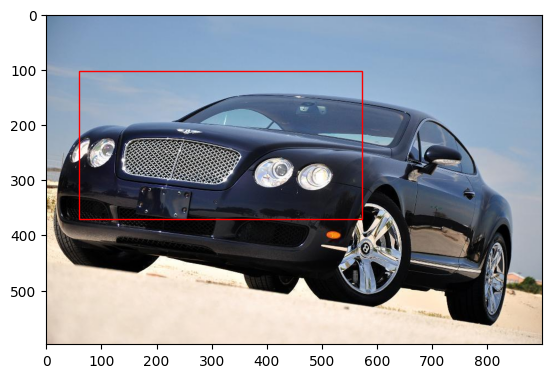

In [ ]:
eval_pred = bbox_eval.copy()

# naive predictions for the bounded box
eval_pred["x_min"] = np.mean(bbox_train["x_min"])
eval_pred["x_max"] = np.mean(bbox_train["x_max"])
eval_pred["y_min"] = np.mean(bbox_train["y_min"])
eval_pred["y_max"] = np.mean(bbox_train["y_max"])

# test on the first image
im_pred_test = eval_pred.iloc[2, 0]
x1, y1, x2, y2 = eval_pred.loc[eval_pred["im_name"] == im_pred_test].iloc[0, 1:]

load_plot(im_pred_test, x1, y1, x2, y2)

<li>Random assignment of car models</li>

In [ ]:
cars_path = "carbon_footprint/models_consumption.csv"
car_models = pd.read_csv(cars_path, sep=",")

# randomly assign CO2 consumption of car models
np.random.seed(1234)
emission = car_models["Average emission of CO2"].dropna()
eval_pred["emissions"] = eval_pred["x_min"].apply(lambda x: np.random.choice(emission, 1)[0])

In [ ]:
eval_pred.head()

,im_name,x_min,y_min,x_max,y_max,emissions
862,42040181.jpg,59.357827,100.829073,572.899894,370.28541,"190,6631579"
1407,615907328.jpg,59.357827,100.829073,572.899894,370.28541,225
463,227278848.jpg,59.357827,100.829073,572.899894,370.28541,"190,6631579"
685,356843520.jpg,59.357827,100.829073,572.899894,370.28541,"190,6631579"
2062,893124608.jpg,59.357827,100.829073,572.899894,370.28541,225


<p style="font-size:20px;color:#12ABDB;text-indent:2em">G. Submission</p>

When access to the tests folder is given (around 13h on Thursday) you need to generate the predictions of you model from the test images.
- Generate a test_pred dataframe with the same structure (same columns order/names) as eval_pred above.

Save it under a csv file on your drive.

In [ ]:
# Submit the results (in CSV format)
eval_pred.to_csv("test_team2.csv", index=False)

Then, submit your predictions using the following form : https://forms.gle/GxtRup6nZuN85rNMA

If you face any issues submitting your file, feel free to reach the organizers.

In [8]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


In [6]:
# import necessary libraries
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
import torchvision
import torch
import numpy as np
import cv2
import os

# get the pretrained model from torchvision.models
# Note: pretrained=True will get the pretrained weights for the model.
# model.eval() to use the model for inference
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model = model.to('cuda')
model.eval()

# Class labels from official PyTorch documentation for the pretrained model
# Note that there are some N/A's
# for complete list check https://tech.amikelive.com/node-718/what-object-categories-labels-are-in-coco-dataset/
# we will use the same list for this notebook
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

In [13]:
def get_prediction(img_path, threshold):
    """
    get_prediction
      parameters:
      - img_path - path of the input image
      - threshold - threshold value for prediction score
    method:
      - Image is obtained from the image path
      - the image is converted to image tensor using PyTorch's Transforms
      - image is passed through the model to get the predictions
      - class, box coordinates are obtained, but only prediction score > threshold
        are chosen.

    """
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    img.to(device)
    pred = model([img])
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
    pred_score = list(pred[0]['scores'].detach().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>threshold][-1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    return pred_boxes, pred_class

def object_detection_api(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3):
    """
    object_detection_api
      parameters:
        - img_path - path of the input image
        - threshold - threshold value for prediction score
        - rect_th - thickness of bounding box
        - text_size - size of the class label text
        - text_th - thichness of the text
      method:
        - prediction is obtained from get_prediction method
        - for each prediction, bounding box is drawn and text is written
          with opencv
        - the final image is displayed
    """
    boxes, pred_cls = get_prediction(img_path, threshold)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(boxes)):
      cv2.rectangle(img, boxes[i][0], boxes[i][1],color=(0, 255, 0), thickness=rect_th)
      cv2.putText(img,pred_cls[i], boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()


In [ ]:
img_path = f"datasets_train/train/{im_test}"
object_detection_api(img_path, threshold=0.8)

Pour l'instant un truc qui marche. Attention, voir i = 120 : il y a deux voitures, comment gérer ?

In [89]:
path_annotrain = "datasets_train/train_annotation/_annotation.csv"
train_annotation = pd.read_csv(path_annotrain)
bbox_train_full = train_annotation.loc[
    :, ["im_name", "x_min", "y_min", "x_max", "y_max"]
]
im_test = bbox_train_full.iloc[2343, 0]
x1, y1, x2, y2 = bbox_train_full.loc[bbox_train_full["im_name"] == im_test].iloc[0, 1:]

img_path = f"datasets_train/train/{im_test}"

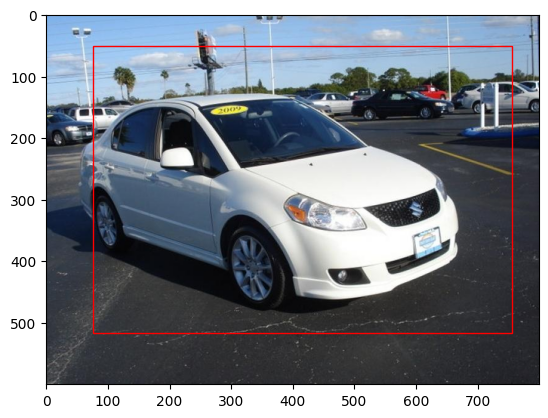

In [110]:
load_plot(im_test, x1_pred, y1_pred, x2_pred, y2_pred)

In [ ]:


# Create an empty DataFrame to store the predictions
columns = ["im_name", "pred_class", "x1_pred", "y1_pred", "x2_pred", "y2_pred", "IoU"]
predictions_df = pd.DataFrame(columns=columns)
# Remove rows with NaN values in any column
bbox_train_full = bbox_train_full.dropna()

# Loop through each row in the original DataFrame
for index, row in bbox_train_full.iterrows():
    im_name = row["im_name"]
    img_path = f"datasets_train/train/{im_name}"

    #get the ground truth
    x1, y1, x2, y2 = bbox_train_full.loc[bbox_train_full["im_name"] == im_name].iloc[0, 1:]

    # Load and transform the image
    img = Image.open(img_path)
    transform = transforms.Compose([transforms.ToTensor()])
    img = transform(img).to(device)

    # Make predictions using your model (replace 'model' with your actual model)
    pred = model([img])
    pred_class = COCO_INSTANCE_CATEGORY_NAMES[pred[0]['labels'].cpu().numpy()[0]]

    # If the predicted class is 'car', get the bounding box coordinates
    if pred_class in ['car', 'truck']:
        pred_box = pred[0]['boxes'].detach().cpu().numpy()[0]
        x1_pred, y1_pred, x2_pred, y2_pred = pred_box
    else:
        x1_pred, y1_pred, x2_pred, y2_pred = 0, 0, 0, 0


    # get the IoU score
    image_IoU = local_IoU(x1_pred, x2_pred, y1_pred, y2_pred, x1, x2, y1, y2)

    # Append the predictions to the new DataFrame
    predictions_df = predictions_df.append(
        {"im_name": im_name, "pred_class": pred_class, "x1_pred": x1_pred, "y1_pred": y1_pred, "x2_pred": x2_pred, "y2_pred": y2_pred, "IoU": image_IoU},
        ignore_index=True
    )

# Now 'predictions_df' contains predictions for each image in 'bbox_train_full'


In [50]:
# Specify the file path where you want to save the CSV file
csv_file_path = "predictions.csv"

# Save the DataFrame to the CSV file
predictions_df.to_csv(csv_file_path, index=False)

In [51]:
predictions_df

,im_name,pred_class,x1_pred,y1_pred,x2_pred,y2_pred,IoU
0,1000407040.jpg,truck,0.000000,20.588579,391.025024,221.147079,0.935632
1,1000472576.jpg,car,0.368645,56.878262,547.513489,288.828583,0.849165
2,1000669184.jpg,car,33.018021,64.770592,499.292389,278.952942,0.903258
3,1000800256.jpg,car,41.778107,18.036085,476.654999,209.722626,0.824340
4,1001324544.jpg,car,33.141621,54.219765,407.498260,291.026184,0.978504
...,...,...,...,...,...,...,...
2340,993853440.jpg,car,0.000000,124.425056,142.824280,287.889252,0.040807
2341,994246656.jpg,car,0.809540,159.826996,78.343369,213.408630,0.007699
2342,999489536.jpg,car,85.593231,202.046036,947.552429,577.188354,0.959845
2343,999686144.jpg,car,76.884834,124.407593,505.295166,288.267883,0.899268


In [52]:
summary_stats = predictions_df["IoU"].describe()


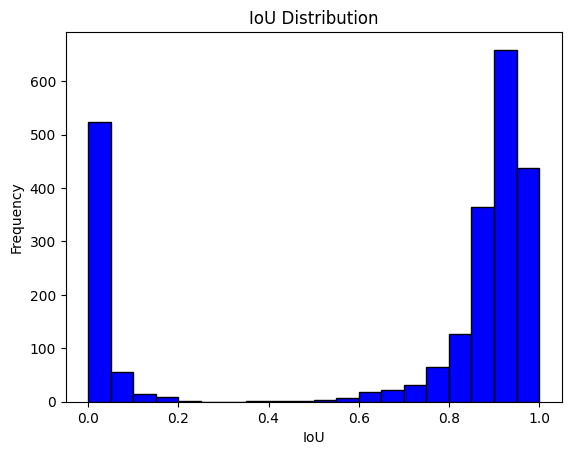

In [53]:
plt.hist(predictions_df["IoU"], bins=20, color='blue', edgecolor='black')
plt.xlabel("IoU")
plt.ylabel("Frequency")
plt.title("IoU Distribution")
plt.show()

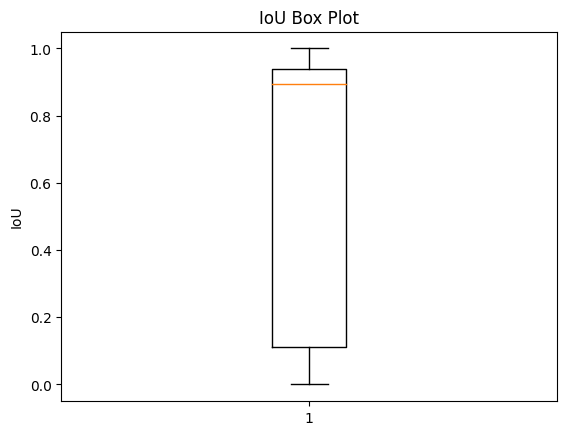

In [54]:
plt.boxplot(predictions_df["IoU"])
plt.ylabel("IoU")
plt.title("IoU Box Plot")
plt.show()

<ipython-input-55-f690866743d6>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(predictions_df["IoU"], shade=True, color='blue')


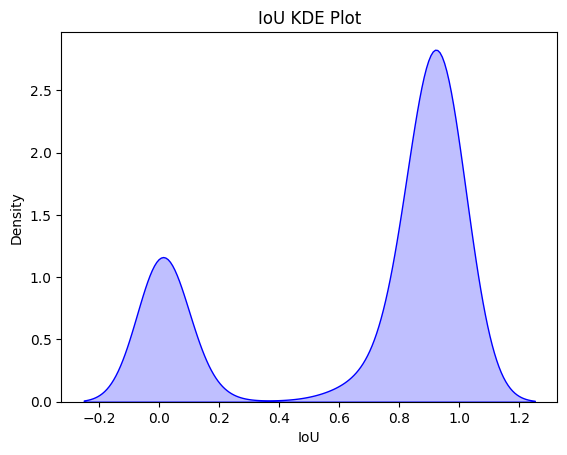

In [55]:
import seaborn as sns

sns.kdeplot(predictions_df["IoU"], shade=True, color='blue')
plt.xlabel("IoU")
plt.title("IoU KDE Plot")
plt.show()

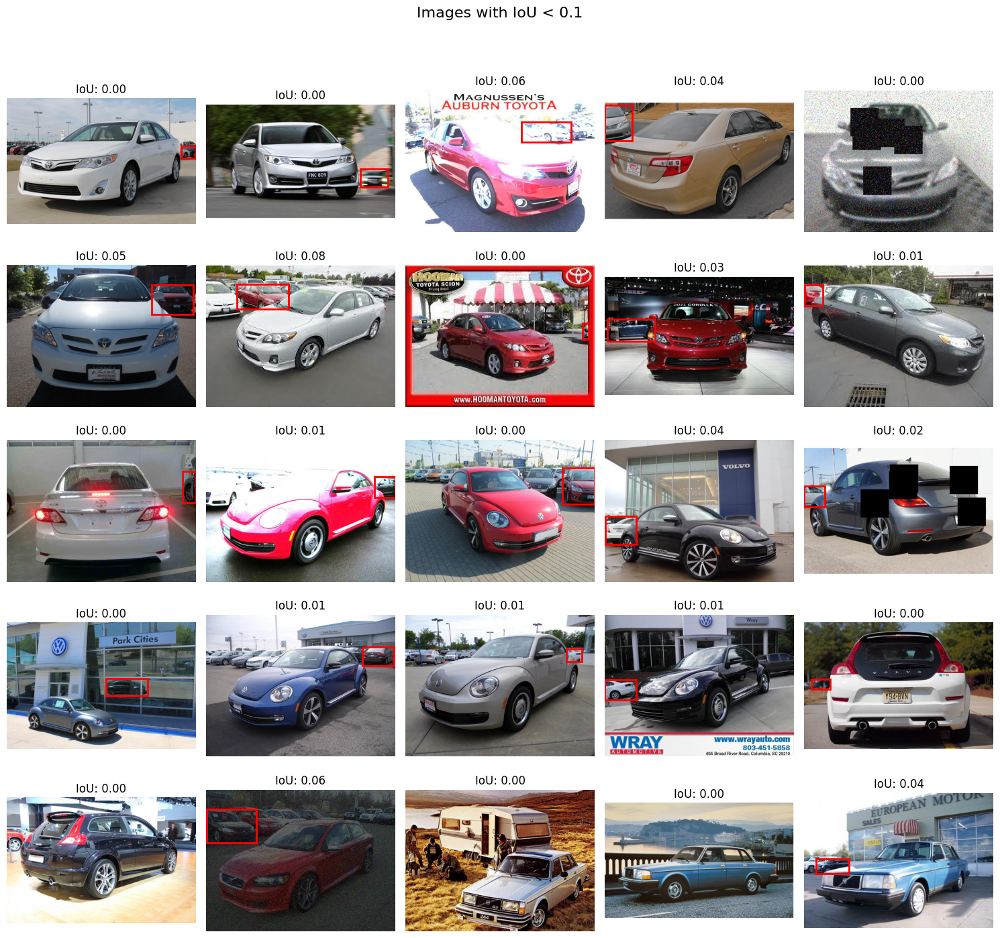

In [67]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Filter rows where IoU is less than 0.1
low_iou_rows = predictions_df[predictions_df["IoU"] < 0.1]

# Limit to a maximum of 10 rows
low_iou_rows = low_iou_rows.head(25)

# Create a single plot with 10 subplots arranged in a grid
fig, axes = plt.subplots(5, 5, figsize=(15,15))
fig.suptitle("Images with IoU < 0.1", fontsize=16)

for ax, index, row in zip(axes.ravel(), low_iou_rows.index, low_iou_rows.itertuples()):
    image_path = f"datasets_train/train/{row.im_name}"
    x1, y1, x2, y2 = row.x1_pred, row.y1_pred, row.x2_pred, row.y2_pred
    iou = row.IoU

    # Load and display the image
    image = Image.open(image_path)
    ax.imshow(image)
    ax.set_title(f"IoU: {iou:.2f}")
    ax.add_patch(patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none'))
    ax.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
fig.savefig("images_with_low_IoU.png")


Idée : dans l'algo qui donne les bbox. prendre seulement celles qui la class 'car' ou 'truck' puis garder celle qui donne la plus grande aire

In [ ]:
model.to('cuda')


# Create an empty DataFrame to store the predictions
columns = ["im_name", "pred_class", "x1_pred", "y1_pred", "x2_pred", "y2_pred", "IoU"]
predictions_df_v2 = pd.DataFrame(columns=columns)

# Remove rows with NaN values in any column
bbox_train_full = bbox_train_full.dropna()

# Loop through each row in the original DataFrame
for index, row in bbox_train_full.iterrows():
    im_name = row["im_name"]
    img_path = f"datasets_train/train/{im_name}"

    # Get the ground truth
    x1, y1, x2, y2 = bbox_train_full.loc[bbox_train_full["im_name"] == im_name].iloc[0, 1:]

    # Load and transform the image
    img = Image.open(img_path)
    transform = transforms.Compose([transforms.ToTensor()])
    img = transform(img).to(device)

    # Make predictions using your model (replace 'model' with your actual model)
    pred = model([img])

    # Filter predicted boxes by class "car" or "truck"
    car_truck_boxes = [box for i, box in enumerate(pred[0]['boxes'].detach().cpu().numpy()) if COCO_INSTANCE_CATEGORY_NAMES[pred[0]['labels'].cpu().numpy()[i]] in ['car', 'truck']]

    if car_truck_boxes:
        # Find the box with the largest area
        largest_area_box = max(car_truck_boxes, key=lambda box: (box[2] - box[0]) * (box[3] - box[1]))
        x1_pred, y1_pred, x2_pred, y2_pred = largest_area_box
    else:
        x1_pred, y1_pred, x2_pred, y2_pred = 0, 0, 0, 0

    # Get the IoU score
    image_IoU = local_IoU(x1_pred, x2_pred, y1_pred, y2_pred, x1, x2, y1, y2)

    # Append the predictions to the new DataFrame
    predictions_df_v2 = predictions_df_v2.append(
        {"im_name": im_name, "pred_class": COCO_INSTANCE_CATEGORY_NAMES[pred[0]['labels'].cpu().numpy()[0]], "x1_pred": x1_pred, "y1_pred": y1_pred, "x2_pred": x2_pred, "y2_pred": y2_pred, "IoU": image_IoU},
        ignore_index=True
    )

# Specify the file path where you want to save the CSV file
csv_file_path_v2 = "predictions_v2.csv"

# Save the DataFrame to the CSV file
predictions_df_v2.to_csv(csv_file_path_v2, index=False)


In [119]:
predictions_df_v2

,im_name,pred_class,x1_pred,y1_pred,x2_pred,y2_pred,IoU
0,1000407040.jpg,truck,0.000000,20.588579,391.025024,221.147079,0.935632
1,1000472576.jpg,car,0.368645,56.878262,547.513489,288.828583,0.849165
2,1000669184.jpg,car,0.000000,67.011765,500.000000,284.198242,0.956416
3,1000800256.jpg,car,41.778107,18.036085,476.654999,209.722626,0.824340
4,1001324544.jpg,car,43.082825,43.165806,418.505585,295.887848,0.892811
...,...,...,...,...,...,...,...
2340,993853440.jpg,car,23.691410,74.706261,959.380615,511.194153,0.849580
2341,994246656.jpg,car,49.189365,119.363777,696.689819,481.235596,0.940944
2342,999489536.jpg,car,85.593231,202.046036,947.552429,577.188354,0.959845
2343,999686144.jpg,car,76.884834,124.407593,505.295166,288.267883,0.899268


In [115]:
summary_stats = predictions_df_v2["IoU"].describe()

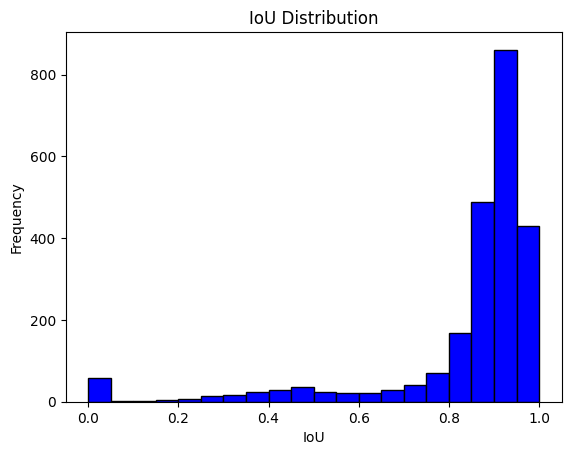

In [120]:
plt.hist(predictions_df_v2["IoU"], bins=20, color='blue', edgecolor='black')
plt.xlabel("IoU")
plt.ylabel("Frequency")
plt.title("IoU Distribution")
plt.show()

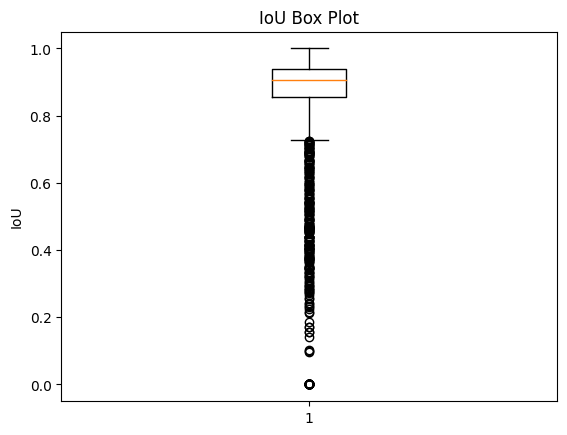

In [121]:
plt.boxplot(predictions_df_v2["IoU"])
plt.ylabel("IoU")
plt.title("IoU Box Plot")
plt.show()

<ipython-input-122-801eec21962d>:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(predictions_df_v2["IoU"], shade=True, color='blue')


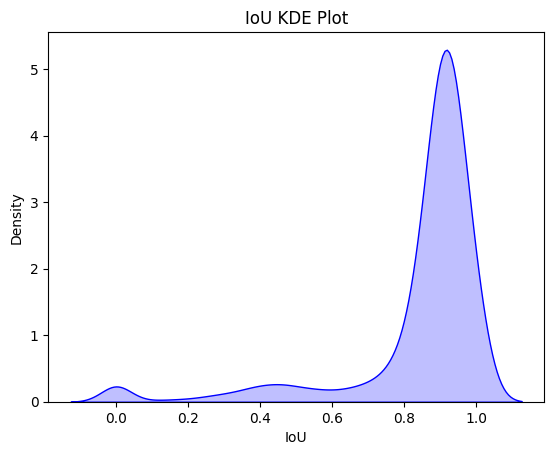

In [122]:
sns.kdeplot(predictions_df_v2["IoU"], shade=True, color='blue')
plt.xlabel("IoU")
plt.title("IoU KDE Plot")
plt.show()

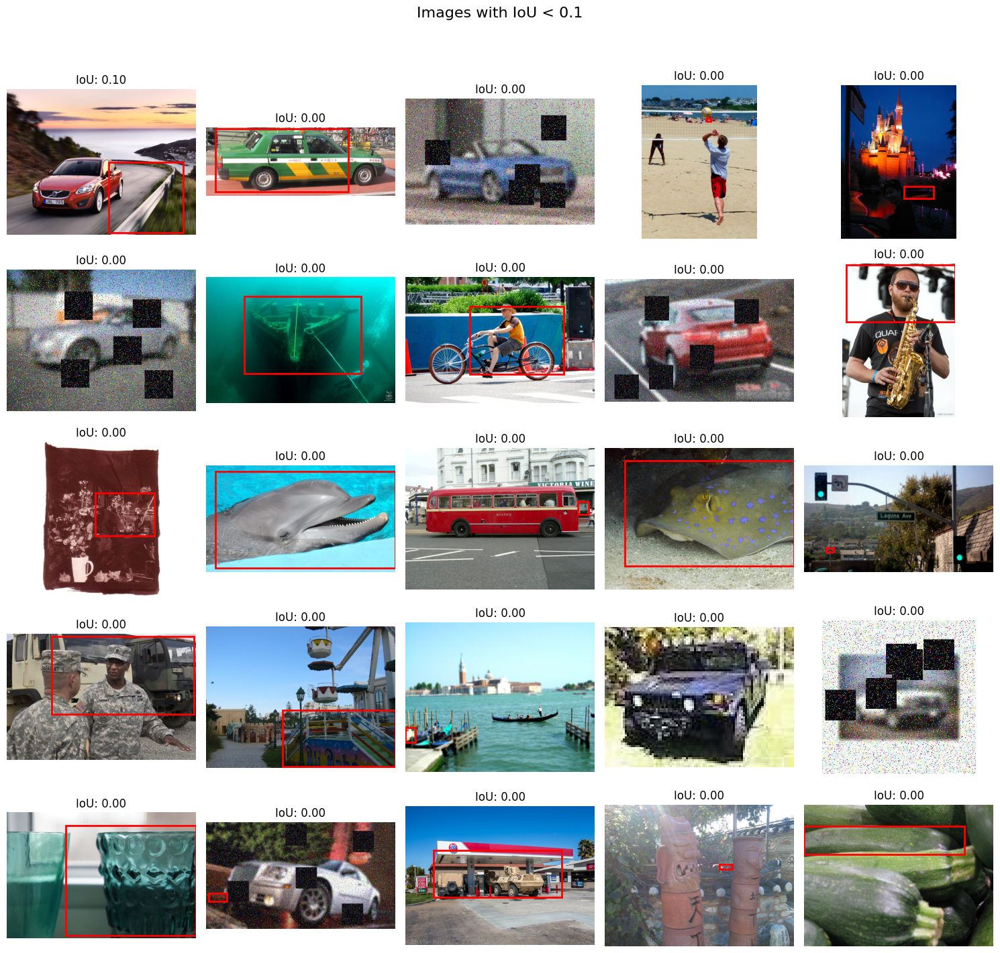

In [123]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Filter rows where IoU is less than 0.1
low_iou_rows = predictions_df_v2[predictions_df_v2["IoU"] < 0.1]

# Limit to a maximum of 10 rows
low_iou_rows = low_iou_rows.head(25)

# Create a single plot with 10 subplots arranged in a grid
fig, axes = plt.subplots(5, 5, figsize=(15,15))
fig.suptitle("Images with IoU < 0.1", fontsize=16)

for ax, index, row in zip(axes.ravel(), low_iou_rows.index, low_iou_rows.itertuples()):
    image_path = f"datasets_train/train/{row.im_name}"
    x1, y1, x2, y2 = row.x1_pred, row.y1_pred, row.x2_pred, row.y2_pred
    iou = row.IoU

    # Load and display the image
    image = Image.open(image_path)
    ax.imshow(image)
    ax.set_title(f"IoU: {iou:.2f}")
    ax.add_patch(patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none'))
    ax.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
fig.savefig("images_with_low_IoU_v2.png")


Pas encore parfait mais déjà beaucoup mieux ! Il faut peut-être essayer de ne garder que les bbox qui ont un confidence score élevé. A voir si ça élimine plus de faux positifs que de vrai positifs.

In [ ]:
# working on gpu
device = 'cuda'

# Set the threshold for the predicted score
score_threshold = 0.85  # Adjust this threshold as needed

# Create an empty DataFrame to store the predictions
columns = ["im_name", "pred_class", "x1_pred", "y1_pred", "x2_pred", "y2_pred", "IoU", "confidence"]
predictions_df_v3 = pd.DataFrame(columns=columns)

# Remove rows with NaN values in any column
bbox_train_full = bbox_train_full.dropna()

# Loop through each row in the original DataFrame
for index, row in bbox_train_full.iterrows():
    im_name = row["im_name"]
    img_path = f"datasets_train/train/{im_name}"

    # Get the ground truth
    x1, y1, x2, y2 = bbox_train_full.loc[bbox_train_full["im_name"] == im_name].iloc[0, 1:]

    # Load and transform the image
    img = Image.open(img_path)
    transform = transforms.Compose([transforms.ToTensor()])
    img = transform(img).to(device)

    # Make predictions using your model (replace 'model' with your actual model)
    pred = model([img])

    # Filter predicted boxes by class "car" or "truck"
    car_truck_boxes = [box for i, box in enumerate(pred[0]['boxes'].detach().cpu().numpy()) if COCO_INSTANCE_CATEGORY_NAMES[pred[0]['labels'].cpu().numpy()[i]] in ['car', 'truck']]

    if car_truck_boxes:

      # Find the box with the largest area and class "car" or "truck"
      largest_area_box = max(car_truck_boxes, key=lambda box: (box[2] - box[0]) * (box[3] - box[1]))

      # Filter boxes that match the largest_area_box and class condition
      matching_boxes = [i for i, box in enumerate(car_truck_boxes) if (box == largest_area_box).all() and (COCO_INSTANCE_CATEGORY_NAMES[pred[0]['labels'].cpu().numpy()[i]] in ['car', 'truck'])]

      if matching_boxes: # Avoid having empty list where max will give an error
          pred_score = max([pred[0]['scores'][i] for i in matching_boxes])
          if pred_score >= score_threshold:
              x1_pred, y1_pred, x2_pred, y2_pred = largest_area_box
      else:
          x1_pred, y1_pred, x2_pred, y2_pred = 0, 0, 0, 0

    else:
        x1_pred, y1_pred, x2_pred, y2_pred = 0, 0, 0, 0

    # Get the IoU score
    image_IoU = local_IoU(x1_pred, x2_pred, y1_pred, y2_pred, x1, x2, y1, y2)

    # Append the predictions to the new DataFrame
    predictions_df_v3 = predictions_df_v3.append(
        {"im_name": im_name, "pred_class": COCO_INSTANCE_CATEGORY_NAMES[pred[0]['labels'].cpu().numpy()[0]], "x1_pred": x1_pred, "y1_pred": y1_pred, "x2_pred": x2_pred, "y2_pred": y2_pred, "IoU": image_IoU, "Confidence": pred_score.detach().cpu().numpy()},
        ignore_index=True
    )

# Specify the file path where you want to save the CSV file
csv_file_path_v3 = "predictions_v3.csv"

# Save the DataFrame to the CSV file
predictions_df_v3.to_csv(csv_file_path_v3, index=False)

print(f"saved csv file as : {csv_file_path_v3}")


In [20]:
summary_stats = predictions_df_v3["IoU"].describe()

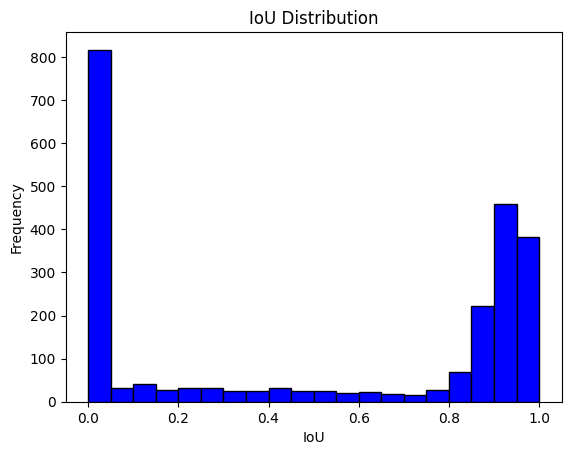

In [21]:
plt.hist(predictions_df_v3["IoU"], bins=20, color='blue', edgecolor='black')
plt.xlabel("IoU")
plt.ylabel("Frequency")
plt.title("IoU Distribution")
plt.show()

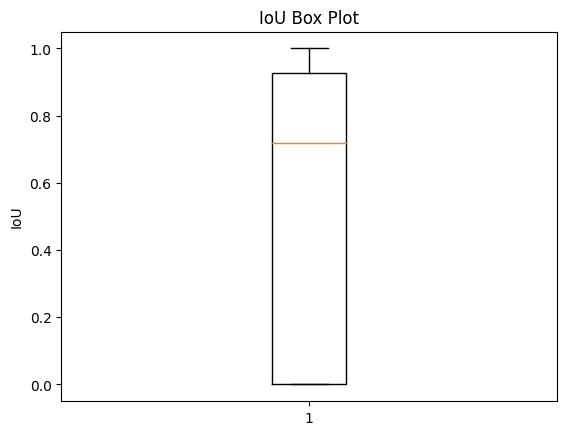

In [22]:
plt.boxplot(predictions_df_v3["IoU"])
plt.ylabel("IoU")
plt.title("IoU Box Plot")
plt.show()

In [23]:
sns.kdeplot(predictions_df_v3["IoU"], shade=True, color='blue')
plt.xlabel("IoU")
plt.title("IoU KDE Plot")
plt.show()

NameError: ignored

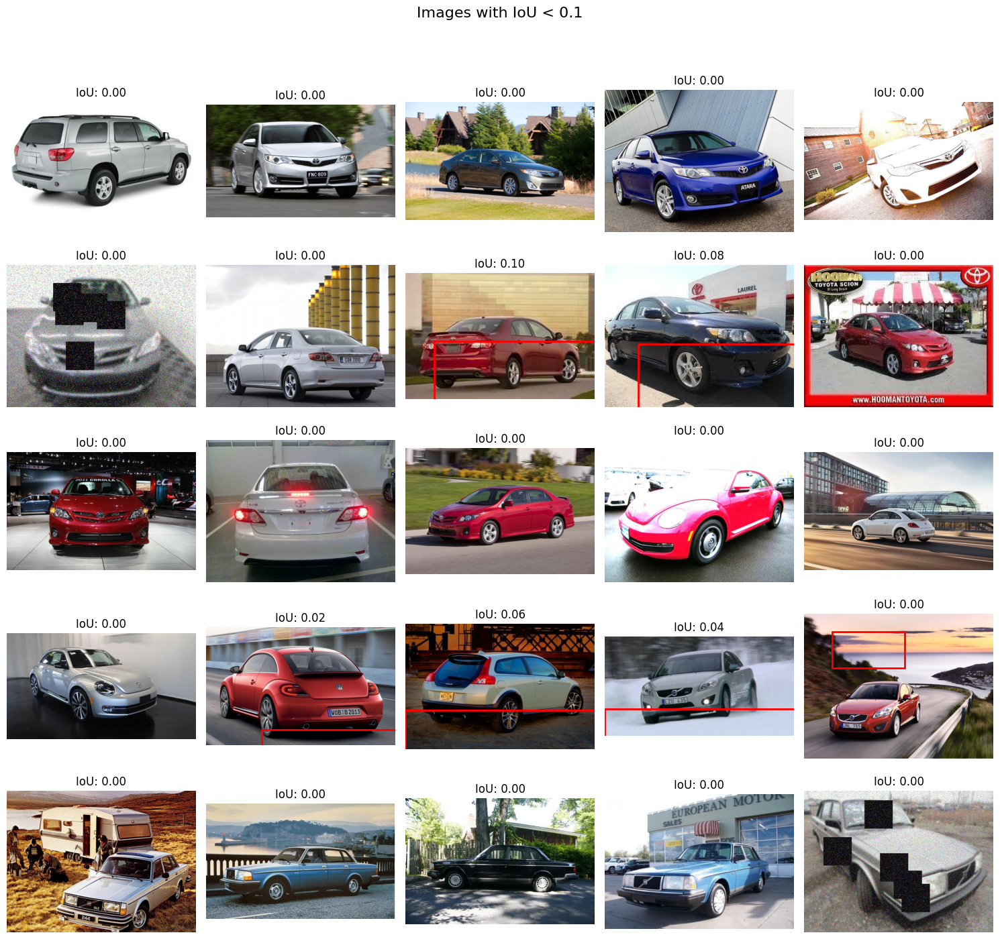

In [24]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Filter rows where IoU is less than 0.1
low_iou_rows = predictions_df_v3[predictions_df_v3["IoU"] < 0.1]

# Limit to a maximum of 10 rows
low_iou_rows = low_iou_rows.head(25)

# Create a single plot with 10 subplots arranged in a grid
fig, axes = plt.subplots(5, 5, figsize=(15,15))
fig.suptitle("Images with IoU < 0.1", fontsize=16)

for ax, index, row in zip(axes.ravel(), low_iou_rows.index, low_iou_rows.itertuples()):
    image_path = f"datasets_train/train/{row.im_name}"
    x1, y1, x2, y2 = row.x1_pred, row.y1_pred, row.x2_pred, row.y2_pred
    iou = row.IoU

    # Load and display the image
    image = Image.open(image_path)
    ax.imshow(image)
    ax.set_title(f"IoU: {iou:.2f}")
    ax.add_patch(patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none'))
    ax.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
fig.savefig("images_with_low_IoU_v3.png")


The threshold is way to high apparently, let's try something lower. We tried do stack images in batches but there are not the same size. Maybe we will try Dynamic Batching

In [ ]:
# working on gpu
device = 'cuda'

# Set the threshold for the predicted score
score_threshold = 0.6  # Adjust this threshold as needed

# Create an empty DataFrame to store the predictions
columns = ["im_name", "pred_class", "x1_pred", "y1_pred", "x2_pred", "y2_pred", "IoU", "Confidence"]
predictions_df_v4 = pd.DataFrame(columns=columns)

# Remove rows with NaN values in any column
bbox_train_full = bbox_train_full.dropna()

# Loop through each row in the original DataFrame
for index, row in bbox_train_full.iterrows():
    im_name = row["im_name"]
    img_path = f"datasets_train/train/{im_name}"

    # Get the ground truth
    x1, y1, x2, y2 = row[1:]

    # Load and transform the image
    img = Image.open(img_path)
    transform = transforms.Compose([transforms.ToTensor()])
    img = transform(img).to(device)

    # Make predictions using your model (replace 'model' with your actual model)
    pred = model([img])

    # Filter predicted boxes by class "car" or "truck"
    car_truck_boxes = [box for i, box in enumerate(pred[0]['boxes'].detach().cpu().numpy()) if COCO_INSTANCE_CATEGORY_NAMES[pred[0]['labels'].cpu().numpy()[i]] in ['car', 'truck']]

    if car_truck_boxes:
        # Find the box with the largest area and class "car" or "truck"
        largest_area_box = max(car_truck_boxes, key=lambda box: (box[2] - box[0]) * (box[3] - box[1]))

        pred_scores = []
        matching_boxes = []

        for i, box in enumerate(car_truck_boxes):
            if (box == largest_area_box).all() and (COCO_INSTANCE_CATEGORY_NAMES[pred[0]['labels'].cpu().numpy()[i]] in ['car', 'truck']):
                matching_boxes.append(i)
                pred_scores.append(pred[0]['scores'][i])

        if matching_boxes:  # Avoid having an empty list where max will give an error
            pred_score = max(pred_scores)
            if pred_score >= score_threshold:
                x1_pred, y1_pred, x2_pred, y2_pred = largest_area_box
        else:
            x1_pred, y1_pred, x2_pred, y2_pred = 0, 0, 0, 0
    else:
        x1_pred, y1_pred, x2_pred, y2_pred = 0, 0, 0, 0

    # Get the IoU score
    image_IoU = local_IoU(x1_pred, x2_pred, y1_pred, y2_pred, x1, x2, y1, y2)

    # Append the predictions to the new DataFrame
    predictions_df_v4 = predictions_df_v4.append(
        {"im_name": im_name, "pred_class": COCO_INSTANCE_CATEGORY_NAMES[pred[0]['labels'].cpu().numpy()[0]], "x1_pred": x1_pred, "y1_pred": y1_pred, "x2_pred": x2_pred, "y2_pred": y2_pred, "IoU": image_IoU, "Confidence": pred_score.detach().cpu().numpy() if 'pred_score' in locals() else 0},
        ignore_index=True
    )

# Specify the file path where you want to save the CSV file
csv_file_path_v4 = "predictions_v3.csv"

# Save the DataFrame to the CSV file
predictions_df_v4.to_csv(csv_file_path_v4, index=False)

print(f"Saved CSV file as: {csv_file_path_v4}")

In [30]:
summary_stats = predictions_df_v4["IoU"].describe()

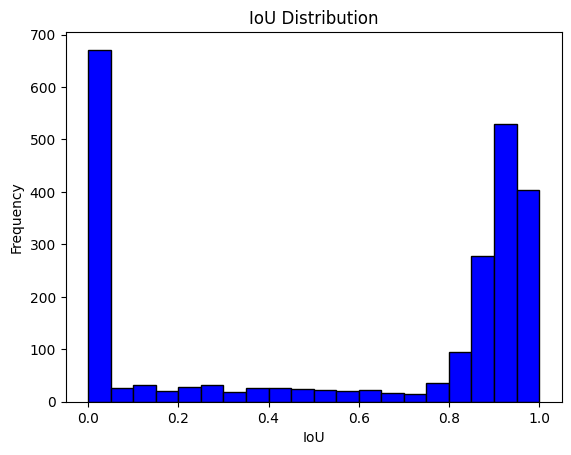

In [31]:
plt.hist(predictions_df_v4["IoU"], bins=20, color='blue', edgecolor='black')
plt.xlabel("IoU")
plt.ylabel("Frequency")
plt.title("IoU Distribution")
plt.show()

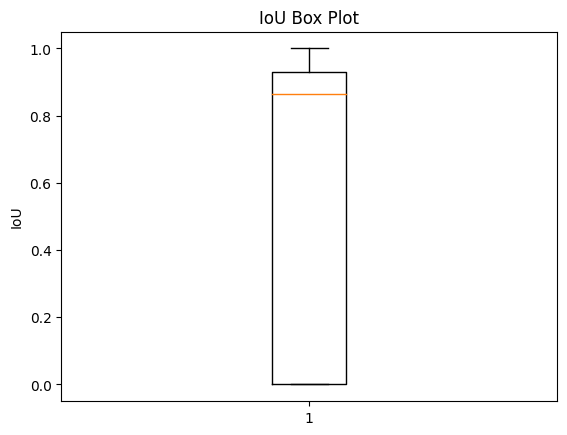

In [32]:
plt.boxplot(predictions_df_v4["IoU"])
plt.ylabel("IoU")
plt.title("IoU Box Plot")
plt.show()

<ipython-input-33-2d51e07ec2e5>:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(predictions_df_v4["IoU"], shade=True, color='blue')


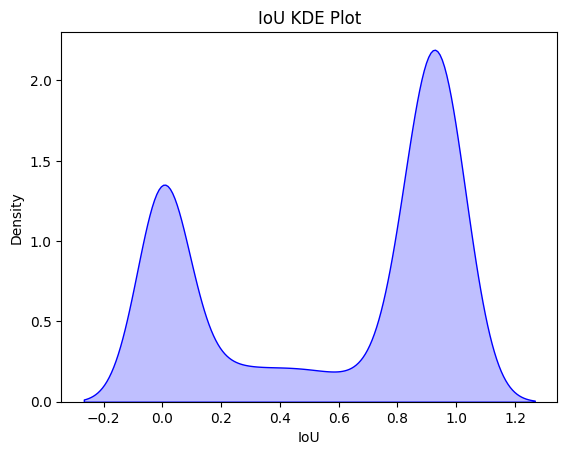

In [33]:
sns.kdeplot(predictions_df_v4["IoU"], shade=True, color='blue')
plt.xlabel("IoU")
plt.title("IoU KDE Plot")
plt.show()

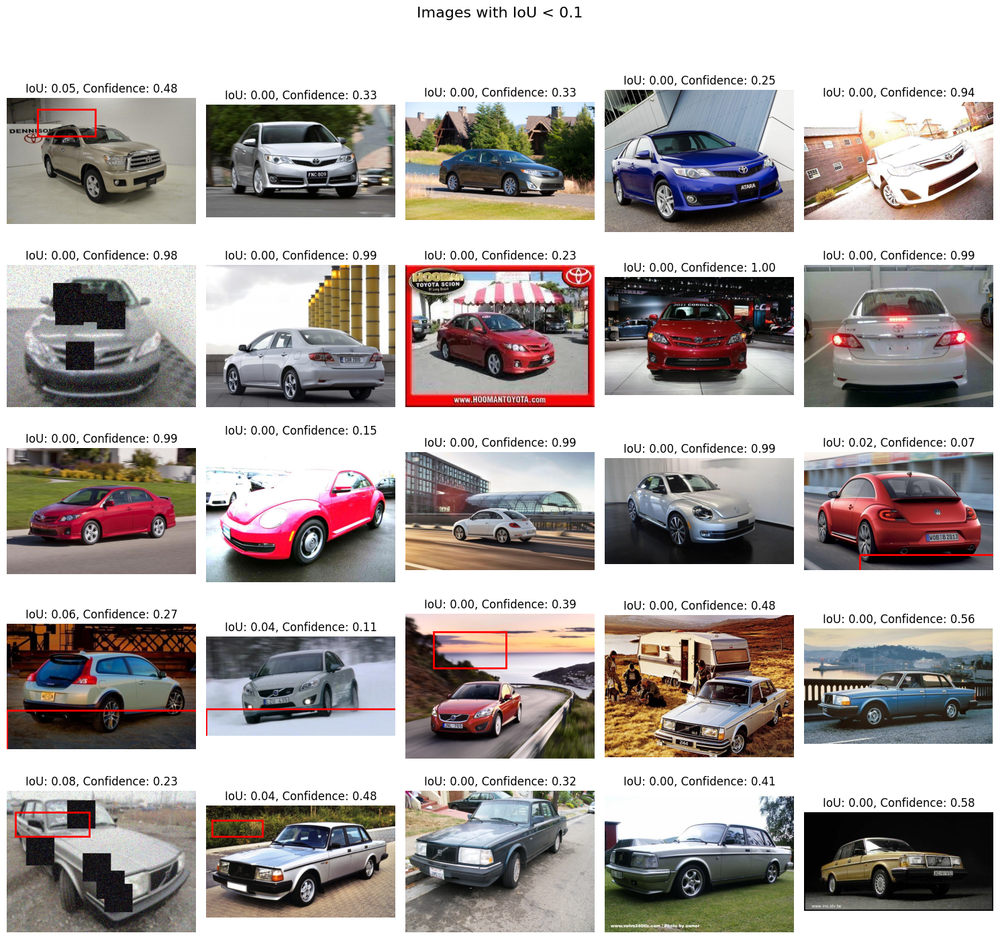

In [35]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Filter rows where IoU is less than 0.1
low_iou_rows = predictions_df_v4[predictions_df_v4["IoU"] < 0.1]

# Limit to a maximum of 10 rows
low_iou_rows = low_iou_rows.head(25)

# Create a single plot with 10 subplots arranged in a grid
fig, axes = plt.subplots(5, 5, figsize=(15,15))
fig.suptitle("Images with IoU < 0.1", fontsize=16)

for ax, index, row in zip(axes.ravel(), low_iou_rows.index, low_iou_rows.itertuples()):
    image_path = f"datasets_train/train/{row.im_name}"
    x1, y1, x2, y2 = row.x1_pred, row.y1_pred, row.x2_pred, row.y2_pred
    iou = row.IoU
    confidence = row.Confidence

    # Load and display the image
    image = Image.open(image_path)
    ax.imshow(image)
    ax.set_title(f"IoU: {iou:.2f}, Confidence: {confidence:.2f}")
    ax.add_patch(patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none'))
    ax.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
fig.savefig("images_with_low_IoU_v4.png")


Even worse

